<a href="https://colab.research.google.com/github/MathenJose/TrackMonitorML/blob/main/yolo_sydney.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [ ]:
!unzip -o /content/syd_train_test_val.zip

Archive:  /content/syd_train_test_val.zip
  inflating: syd_train_test_val/test/images/EditedFrame36_jpg.rf.6795d8350f4ecc8514b2fe655e586ebc.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame37_jpg.rf.543588968013e5f4782811d0d53bc652.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame38_jpg.rf.3e799b9e07f88442009d7e22373bf862.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame39_jpg.rf.0290e5ab0b6dfea3cd50fde2d8935e59.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame40_jpg.rf.52cb30ca6441cbe1755abfae6308920e.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame41_jpg.rf.6ef72158bfb1afd5b752281f3de4ee8c.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame42_jpg.rf.1c52804b0bef3428fc70022af85e9d6f.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame43_jpg.rf.63facbbd627e16ee6ec3f97983be0a39.jpg  
  inflating: syd_train_test_val/test/images/EditedFrame44_jpg.rf.c3afd916743ecba817d89cf3011870af.jpg  
  inflating: syd_train

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12805, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 12805 (delta 48), reused 70 (delta 40), pack-reused 12719
Receiving objects: 100% (12805/12805), 12.36 MiB | 31.40 MiB/s, done.
Resolving deltas: 100% (8805/8805), done.
/content/yolov5/yolov5/yolov5
Setup complete. Using torch 1.12.0+cu113 (Tesla T4)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

Extracting Dataset Version Zip to /content/datasets/American-Mushrooms-1 in yolov5pytorch:: 100%|██████████| 278/278 [00:00<00:00, 1046.33it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!python train.py --img 416 --batch 8 --epochs 50 --data /content/yolov5/data/coco.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data/coco.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 782), started 0:23:23 ago. (Use '!kill 782' to kill it.)

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 416 --conf 0.3 --source /content/syd_train_test_val/valid/images --save-txt 

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/syd_train_test_val/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/90 /content/syd_train_test_val/valid/images/EditedFrame46_jpg.rf.f6feeb6c73375a6fd94d6715d7b66367.jpg: 416x416 1 sleeper, 1 fastener, Done. (0.008s)
image 2/90 /content/syd_train_test_val/valid/images/EditedFrame47_jpg.rf.2432d643d70693601f266fc82ab7bf90.jpg: 416x416 2 sleepers, Done. (0.008s)
image 3/90 /content/s

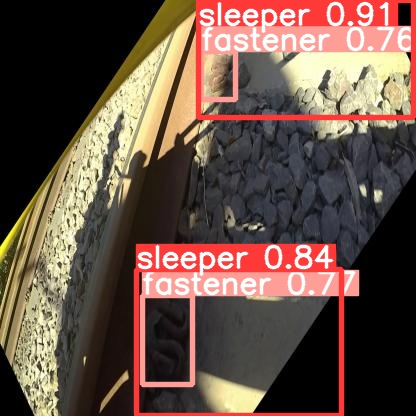

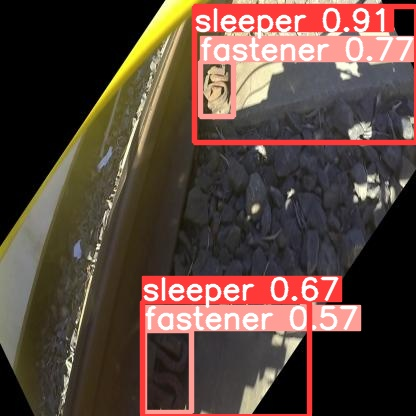

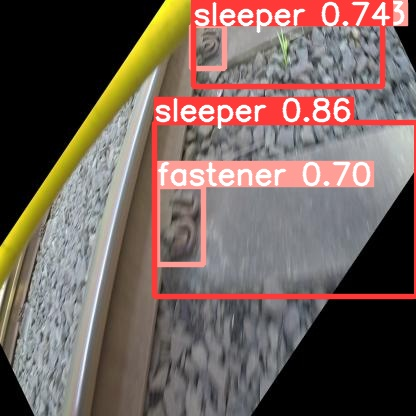

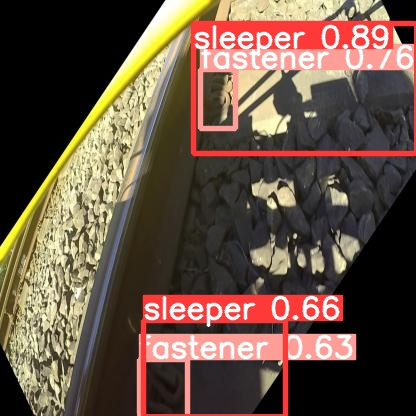

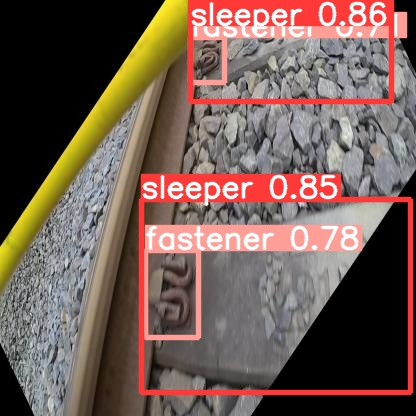

...

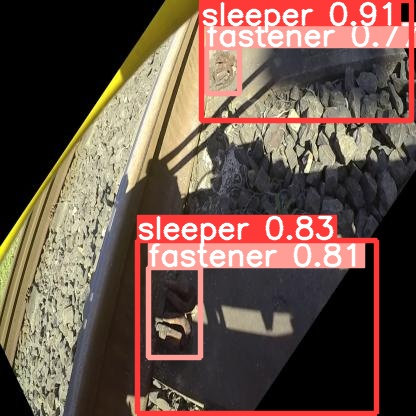

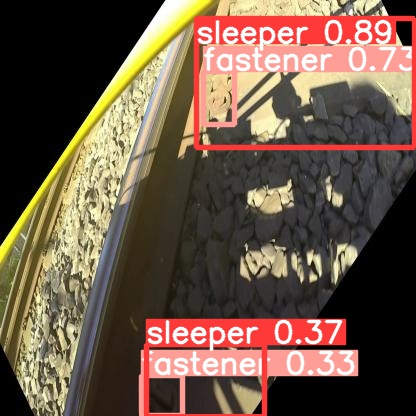

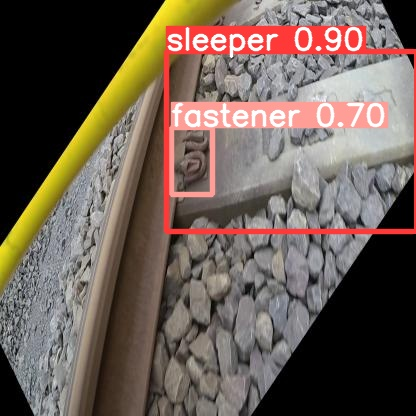

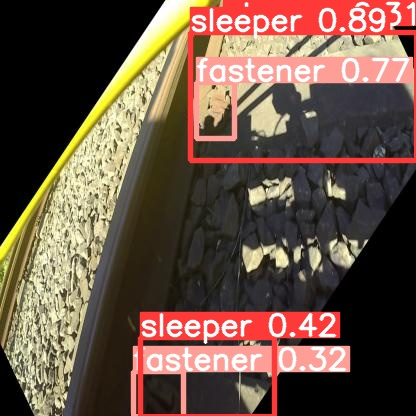

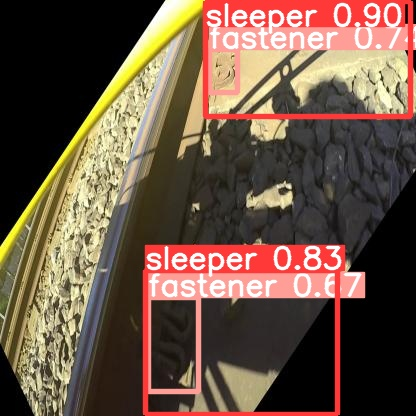

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp8/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

FileNotFoundError: ignored

In [ ]:
!zip -r /content/labels.zip /content/yolov5/runs/detect/exp9/labels

  adding: content/yolov5/runs/detect/exp9/labels/ (stored 0%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame870_jpeg.rf.4cbf4e907347f5ee84b8fa2e2545bf00.txt (deflated 41%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame829_jpeg.rf.f579a93baa07d13e92fba0992bdf56af.txt (deflated 45%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame848_jpeg.rf.365b26e5c13cee3976506b1ab6847f0a.txt (deflated 42%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame831_jpeg.rf.42b4aef0e6aa1e645bb7037d87f3af85.txt (deflated 43%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame866_jpeg.rf.5010906bff903257b8c02857b4bed2ce.txt (deflated 26%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame867_jpeg.rf.83890c0062c3dfcf090aa26d60087bb0.txt (deflated 45%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame819_jpeg.rf.74f4221da769c9e03e57902ed60886c0.txt (deflated 28%)
  adding: content/yolov5/runs/detect/exp9/labels/Frame894_jpeg.rf.6ef0cebe12b8ab19b0edd426cf26e0f9.txt (deflated

In [ ]:
from google.colab import files
files.download("/content/labels.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>